In [1]:
from google.colab import files
uploaded = files.upload()

Saving kaggle.json to kaggle.json


#Cat and Dog classifier
In this notebook I'm gonna build a CNN model for cat and dog classification problem. The CNN architecture which I'm going to use is based on [VGG](https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&ved=2ahUKEwiA5P_LiNnpAhXBknIEHWl_B8MQFjAAegQIAxAB&url=https%3A%2F%2Farxiv.org%2Fpdf%2F1409.1556&usg=AOvVaw3u_l2DJveBaeO_vs_qyLMT) acrchitecture.
Also I will use Pytorch for main framework.


The dataset I'm going to use is [this dataset](https://www.kaggle.com/biaiscience/dogs-vs-cats) from Kaggle website. It contains 25000 images for training set and 12500 images for test set.


In [0]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [3]:
import os
from datetime import datetime
from random import randrange
from datetime import datetime
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import image as mpimg
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim

print('setup done')

setup done


So at the first step, we're going to download and arrange the dataset. So we create two folders which contains train set and test set images.




In [0]:
! mkdir training_dataset
! mkdir test_dataset

In [5]:
!kaggle datasets download -d biaiscience/dogs-vs-cats

 97% 793M/817M [00:14<00:00, 58.7MB/s]
100% 817M/817M [00:14<00:00, 59.8MB/s]


In [0]:
import zipfile
with zipfile.ZipFile("dogs-vs-cats.zip", 'r') as zip_ref:
    zip_ref.extractall(".")

In [7]:
counter = 0
src_name = './train/train/'
for f in os.listdir(src_name):
    os.rename(f'{src_name}{f}', f'./training_dataset/{f}')
    counter += 1
print(counter)

counter = 0
src_name = './test/test/'
for f in os.listdir(src_name):
    os.rename(f'{src_name}{f}', f'./test_dataset/{f}')
    counter += 1
print(counter)

25000
12500


In [0]:
! rm -rf test train dogs-vs-cats.zip

As you can see as we said, there is 25000 images for train set and 12500 images for test set and we moved train images to training_dataset folder and test images to test_dataset.

In [0]:
n_training_data = len(os.listdir('training_dataset'))
n_test_data = len(os.listdir('test_dataset'))

print('total training data: ', n_training_data)
print('total test data: ', n_test_data)

total training data:  25000
total test data:  12500


In [0]:
! mkdir ./training_dataset/dogs
! mkdir ./training_dataset/cats

In [0]:
! mkdir validation_dataset
! mkdir validation_dataset/dogs/
! mkdir validation_dataset/cats/

Also we created a Validation folder for validating model during training.

In [0]:
ndogs = ncats = 0
for f in os.listdir('./training_dataset'):
    if 'dog' in f and f != 'dogs':
        os.rename(f'./training_dataset/{f}', f'./training_dataset/dogs/{f}')
        ndogs += 1
    elif 'cat' in f and f != 'cats':
        os.rename(f'./training_dataset/{f}', f'./training_dataset/cats/{f}')
        ncats += 1
print('successfully created')
print(f'#cats: {ncats} , #dogs: {ndogs}')

successfully created
#cats: 12500 , #dogs: 12500


No we have two subfolders which contains images of each category.

In [0]:
train_path = './training_dataset/'
valid_path = './validation_dataset/'
for i in range(1000):
    r = randrange(len(os.listdir(train_path + 'dogs/')))
    f = os.listdir(train_path + 'dogs/')[r]
    os.rename(f'{train_path}dogs/{f}', f'{valid_path}dogs/{f}')

    r = randrange(len(os.listdir(train_path + 'cats/')))
    f = os.listdir(train_path + 'cats/')[r]
    os.rename(f'{train_path}cats/{f}', f'{valid_path}cats/{f}')

print('total validation set : ', len(os.listdir(valid_path + 'dogs/')) + len(os.listdir(valid_path + 'cats/')))

And also we arrange the validation subfolders same as training folder.

In [0]:
def load_dataset(data_path):
    transformations = torchvision.transforms.Compose([
        transforms.Resize(255),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transformations,
    )

    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=64,
        shuffle=True
    )

    return train_loader

Then we wrote a python function to return the disired dataset based on Pytorch DataLoader.


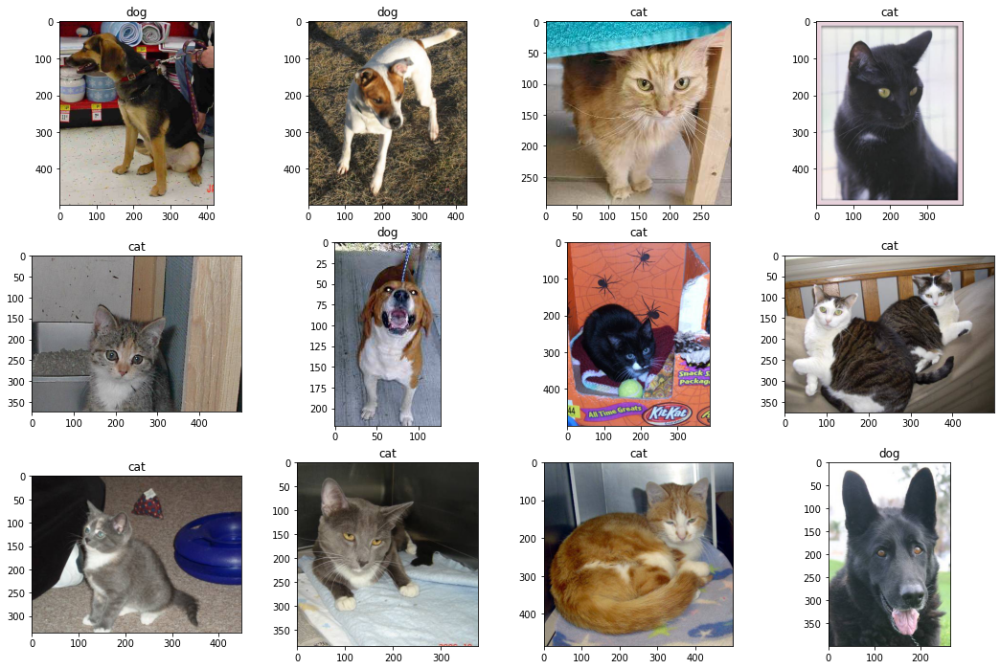

In [0]:
plt.figure(figsize=(18, 12))
for i in range(12):
    plt.subplot(3, 4, i+1)
    cat_or_dog = randrange(2)
    if cat_or_dog == 1:
        src = './training_dataset/dogs/'
        r = randrange(len(os.listdir(src)))
        img = mpimg.imread(src + os.listdir(src)[r])
        title = 'dog'
    else:
        src = './training_dataset/cats/'
        r = randrange(len(os.listdir(src)))
        img = mpimg.imread(src + os.listdir(src)[r])
        title = 'cat'
    plt.title(title)
    plt.imshow(img)

In [0]:
training_dataset = load_dataset('./training_dataset')
validation_dataset = load_dataset('./validation_dataset')

# Building the model

In [0]:
class VGGNet(nn.Module):

    def __init__(self, num_classes=2):
        super(VGGNet, self).__init__()
        self.features = self.make_layers()
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 1024),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(1024, 1024),
            nn.ReLU(True),
            nn.Dropout(),
            nn.Linear(1024, num_classes),
        )
        self._initialize_weights()
        

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x


    def make_layers(self, batch_norm=False):
        layers = []
        in_channels = 3
        cfg = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512, 'M', 512, 512, 512, 'M']
        for v in cfg:
            if v == 'M':
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
            else:
                conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=1)
                if batch_norm:
                    layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
                else:
                    layers += [conv2d, nn.ReLU(inplace=True)]
                in_channels = v
        return nn.Sequential(*layers)


    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

#Training the model

In [0]:
device = torch.device('cuda:0')

model = VGGNet()
model.to(device)

epochs = 25
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, weight_decay= 0.001, momentum=0.9)
total_training_losses = []
total_validation_losses = []
since = datetime.now()


for epoch in range(epochs):
    train_loss = 0
    model.train()
    start_epoch = datetime.now()
    for iteration, (data, label) in enumerate(training_dataset):
        optimizer.zero_grad()
        output = model(data.to(device))
        loss = criterion(output, label.to(device))
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * data.shape[0]
        
        if iteration % 300 == 0:
            val_loss = 0
            running_corrects = 0
            model.eval()
            size = 0
            with torch.no_grad():
                for data, label in validation_dataset:
                    output = model(data.to(device))
                    loss = criterion(output, label.to(device))
                    pred = output.argmax(dim=1, keepdim=True) 
                    running_corrects += pred.eq(label.to(device).view_as(pred)).sum().item()
                    size += data.shape[0]
                    val_loss += loss.item() * data.shape[0]

                val_loss = val_loss / len(validation_dataset.dataset)
                total_validation_losses.append(val_loss)
                accuracy = running_corrects / size
                print('*'*75)
                format_str = 7 * ' ' + '*'
                begin = '*' + 7 * ' '
                print('{:s}Epoch: {} , validation_iter:{} , val_loss: {:.3f} , acc: {:.3f}{:s}'.format(begin, epoch+1, (iteration//300)+1, val_loss, accuracy, format_str))

            model.train()

    end_epoch = datetime.now()
    train_loss = train_loss / len(training_dataset.dataset)
    total_training_losses.append(train_loss)
    time = (end_epoch - start_epoch).microseconds
    print('-.'*40, '\nEpoch: {},   Training Loss: {:.3f},   Time: {}'.format(epoch+1, train_loss, time))

end = datetime.now()

torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
}, './model')

***************************************************************************
*       Epoch: 1 , validation_iter:1 , val_loss: 0.693 , acc: 0.500       *
***************************************************************************
*       Epoch: 1 , validation_iter:2 , val_loss: 0.678 , acc: 0.589       *
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-. 
Epoch: 1,   Training Loss: 0.678,   Time: 186061
***************************************************************************
*       Epoch: 2 , validation_iter:1 , val_loss: 0.637 , acc: 0.651       *
***************************************************************************
*       Epoch: 2 , validation_iter:2 , val_loss: 0.540 , acc: 0.746       *
-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-. 
Epoch: 2,   Training Loss: 0.606,   Time: 692717
***************************************************************************
*       Epoch: 3 , validation_iter:1 , val_loss: 0.565

# Testing the model
Now we're gonna run the model on the 140 images from the test dataset.
below images are the results.

In [0]:
counter = 0
for f in os.listdir('./test_dataset'):
    if 'rand' in f:
        continue
    if counter > 140:
       os.rename(f'./test_dataset/{f}', f'./other_test/{f}')
       counter += 1
       continue
    if counter < 70:
        os.rename(f'./test_dataset/{f}', f'./test_dataset/rand2/{f}')
        counter += 1
        continue
    os.rename(f'./test_dataset/{f}', f'./test_dataset/rand1/{f}')
    counter += 1

In [14]:
model = VGGNet()
checkpoint = torch.load('./drive/My Drive/model.dms')
model.load_state_dict(checkpoint['model_state_dict'])
device = torch.device('cuda:0')
model.to(device)

VGGNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilatio

In [0]:
model.eval()
predictions = []
with torch.no_grad():
    for data, _ in test_dataset:
        predictions += model(data.to(device))

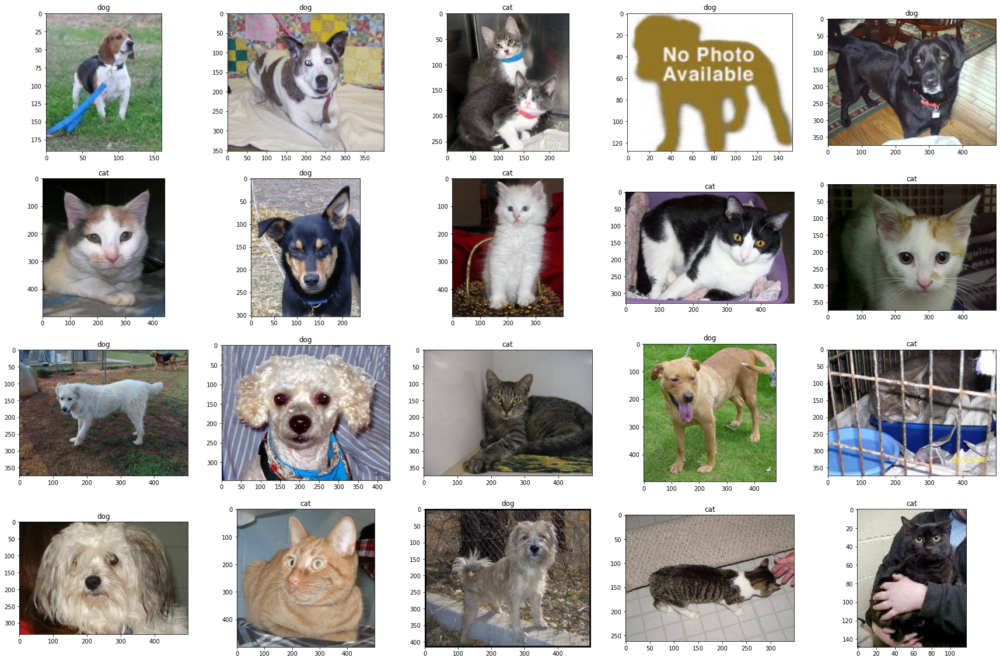

In [25]:
plt.figure(figsize=(30, 20))
for i in range(20):
    image = test_dataset.dataset.imgs[i][0]
    pred = predictions[i]
    pred = pred.argmax()
    plt.subplot(4, 5, i+1)
    img = mpimg.imread(image)
    title = 'cat' if pred == 0 else 'dog'
    plt.title(title)
    plt.imshow(img)

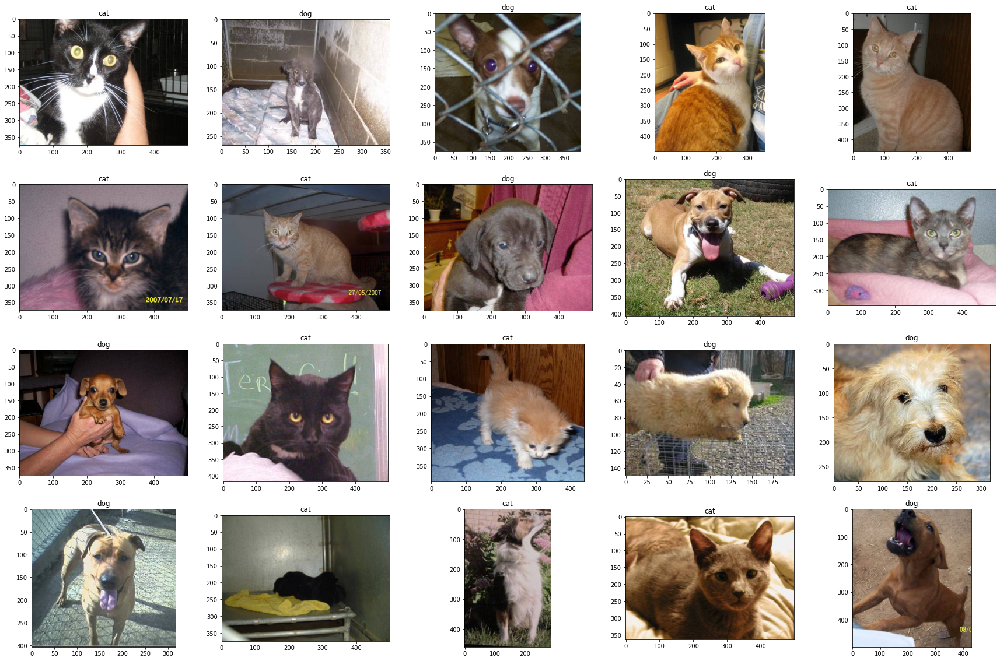

In [26]:
plt.figure(figsize=(30, 20))
for i in range(20):
    image = test_dataset.dataset.imgs[20+i][0]
    pred = predictions[20+i]
    pred = pred.argmax()
    plt.subplot(4, 5, i+1)
    img = mpimg.imread(image)
    title = 'cat' if pred == 0 else 'dog'
    plt.title(title)
    plt.imshow(img)

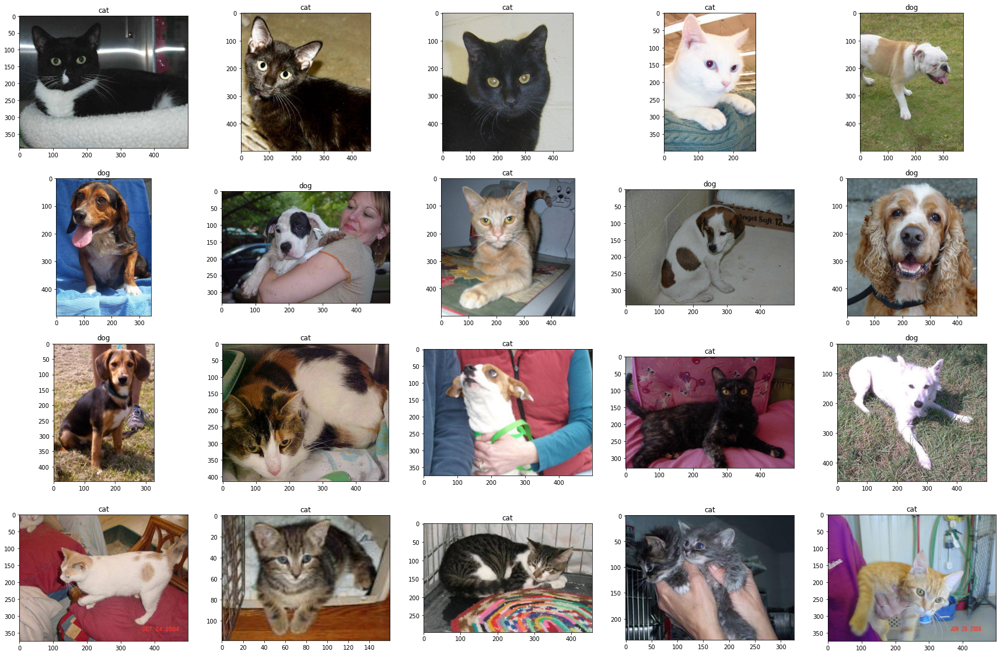

In [27]:
plt.figure(figsize=(30, 20))
for i in range(20):
    image = test_dataset.dataset.imgs[40+i][0]
    pred = predictions[40+i]
    pred = pred.argmax()
    plt.subplot(4, 5, i+1)
    img = mpimg.imread(image)
    title = 'cat' if pred == 0 else 'dog'
    plt.title(title)
    plt.imshow(img)

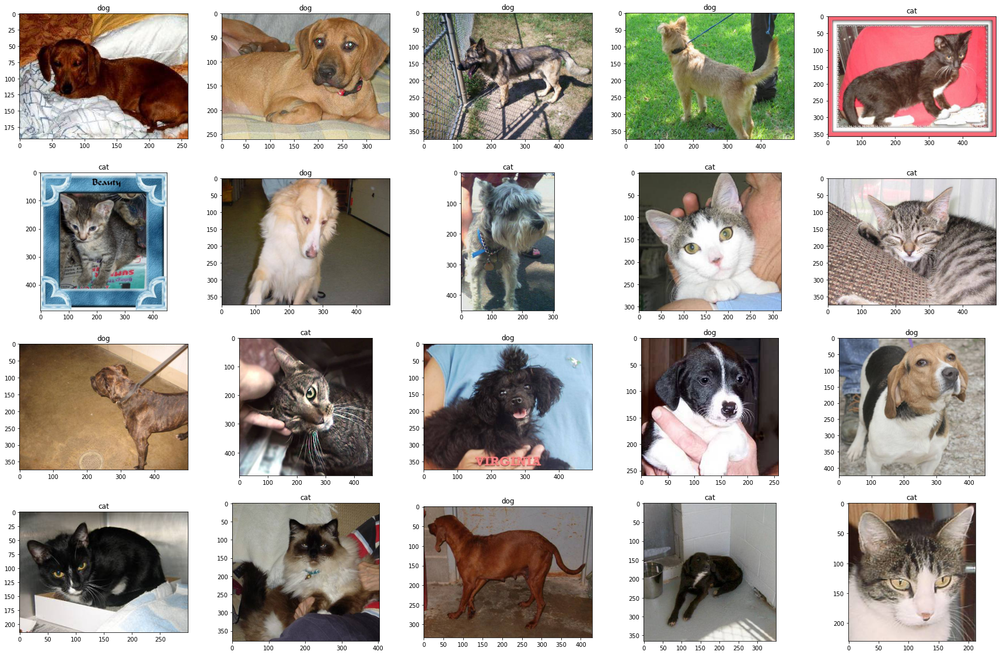

In [28]:
plt.figure(figsize=(30, 20))
for i in range(20):
    image = test_dataset.dataset.imgs[60+i][0]
    pred = predictions[60+i]
    pred = pred.argmax()
    plt.subplot(4, 5, i+1)
    img = mpimg.imread(image)
    title = 'cat' if pred == 0 else 'dog'
    plt.title(title)
    plt.imshow(img)

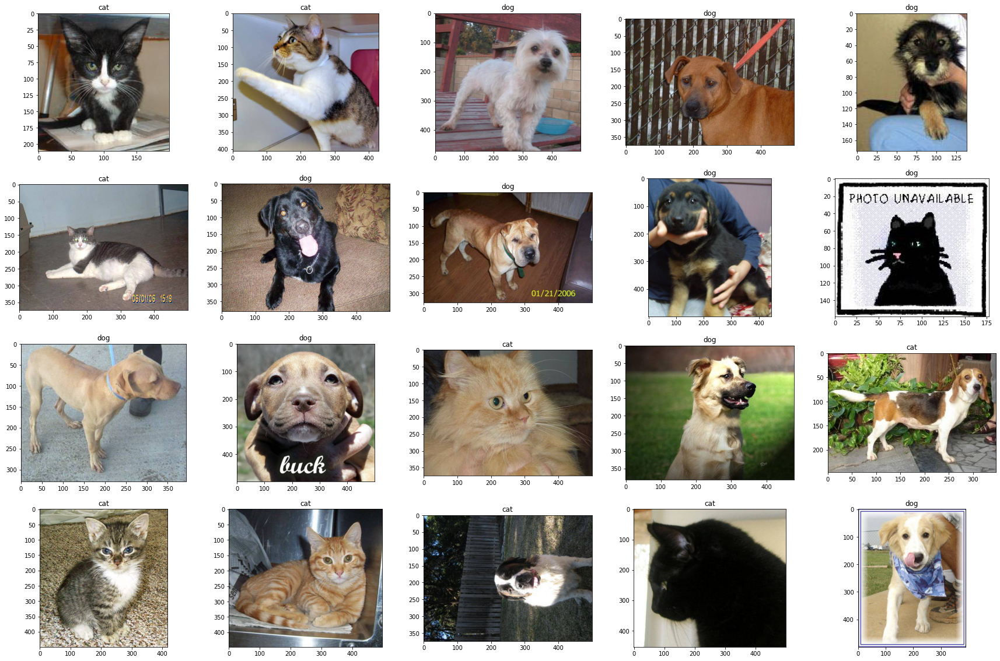

In [29]:
plt.figure(figsize=(30, 20))
for i in range(20):
    image = test_dataset.dataset.imgs[80+i][0]
    pred = predictions[80+i]
    pred = pred.argmax()
    plt.subplot(4, 5, i+1)
    img = mpimg.imread(image)
    title = 'cat' if pred == 0 else 'dog'
    plt.title(title)
    plt.imshow(img)

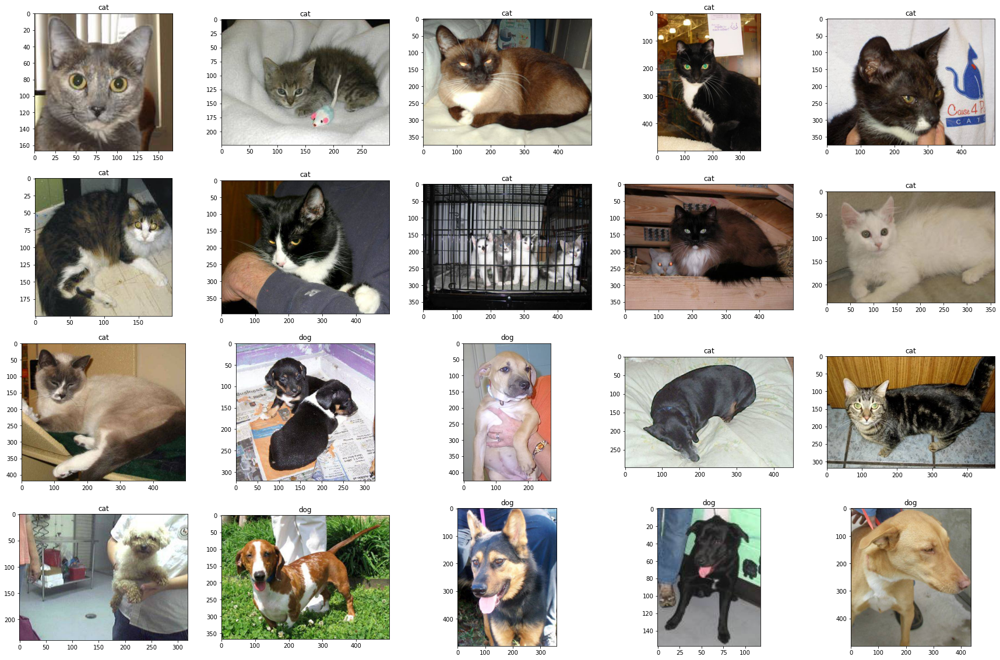

In [30]:
plt.figure(figsize=(30, 20))
for i in range(20):
    image = test_dataset.dataset.imgs[100+i][0]
    pred = predictions[100+i]
    pred = pred.argmax()
    plt.subplot(4, 5, i+1)
    img = mpimg.imread(image)
    title = 'cat' if pred == 0 else 'dog'
    plt.title(title)
    plt.imshow(img)

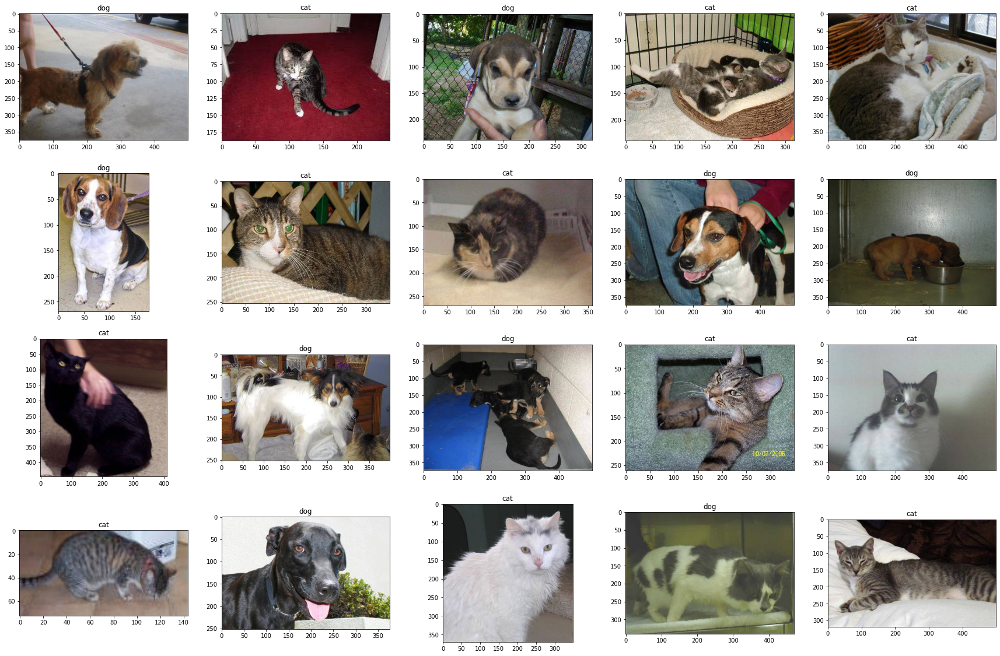

In [31]:
plt.figure(figsize=(30, 20))
for i in range(20):
    image = test_dataset.dataset.imgs[120+i][0]
    pred = predictions[120+i]
    pred = pred.argmax()
    plt.subplot(4, 5, i+1)
    img = mpimg.imread(image)
    title = 'cat' if pred == 0 else 'dog'
    plt.title(title)
    plt.imshow(img)